# Machine learning for classification Project

Name: You ZUO, Kexin SHAO

Date: 02/11/2020

Choice of digits for binary classifiers: 6 and 8

In [1]:
# upload packages
import random as rd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap 

import statistics as stat
import math
%matplotlib inline

In [2]:
from sklearn import datasets
# uploading the dataset
digits = datasets.load_digits()
X=digits.data; y=digits.target

In our project, we pick up only the digits with **two labels '6' and '8'** in the dataset, and we are going to build binary classifiers using this dataset.

In [3]:
# filter the dataset (label = 0,8)
filter_ = [i for i in range(len(y)) if (y[i] == 8 or y[i]==6)]
obs = X[filter_]; label = y[filter_]
val,cnt = np.unique(label,return_counts=True)

print("The number of samples with label = {} is {}.".format(val[0],cnt[0]))
print("The number of samples with label = {} is {}.".format(val[1],cnt[1]))

The number of samples with label = 6 is 181.
The number of samples with label = 8 is 174.


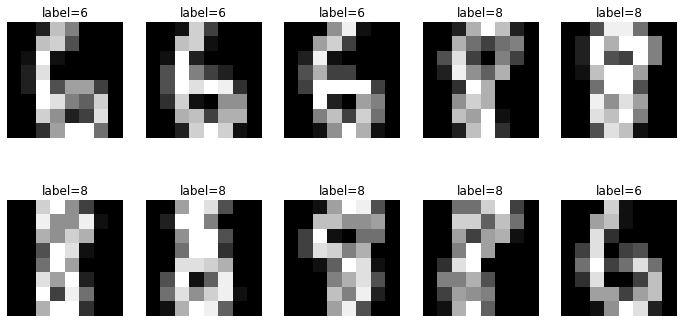

In [4]:
# pick up randomly 10 samples from our dataset
samples = np.random.randint(0,len(label),10)

plt.figure(figsize=(12,6))
for i,ix in enumerate(samples):
    plt.subplot(2,5,i+1)

    img=np.array(obs[ix], dtype='uint8').reshape(8,8)
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    plt.title('label=' + str(label[ix]))

We want to visualize the distribution of our samples in 2-D. In order to achieve this, we apply a PCA with two components:

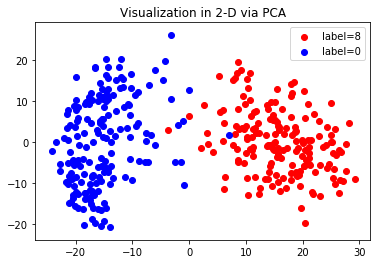

In [5]:
# pca
from sklearn.decomposition import PCA
pca = PCA(n_components=2);pca.fit(obs)
points_PCA = pca.transform(obs)

plt.scatter(points_PCA[np.argwhere(label == 8),0], 
            points_PCA[np.argwhere(label == 8),1], 
            c="red")
plt.scatter(points_PCA[np.argwhere(label == 6),0], 
            points_PCA[np.argwhere(label == 6),1], 
            c="blue")

plt.legend(["label=8",'label=0'])
plt.title("Visualization in 2-D via PCA")
plt.show()

## Construction of Models
### simple binary classifiers (Bayes, LDA, QDA, LogReg, KNN, tree)

We would like first to implement all possible simple binary classifiers, and then choose the best one by evaluating their performances.

In [6]:
# packages required for simple classifiers
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn import linear_model
from sklearn.neighbors import KNeighborsClassifier 
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

from sklearn.model_selection import KFold
from sklearn import metrics, preprocessing

import copy
import seaborn as sns

In [7]:
# label encoder for our label vector, in order to do binary classification later
le = preprocessing.LabelEncoder()
label=le.fit_transform(label)
le.transform([6,8]) # we transform digits 6 as "0" and digits 8 as "1" for binary labels

array([0, 1])

In [8]:
def cvtrain_performance(model,k=3,x=obs,y=label):
    '''
    train our model using a k-fold cross-validation,
    and return the evaluations on training and testing sets separately
    '''
    # split our dataset randomly into k folds
    kf = KFold(n_splits=k,shuffle=True)

    # metrics we want to use:
    pfmc_train = {'accuracy':[],'precision':[],'recall':[],'f1':[],'auc':[]}
    pfmc_test = copy.deepcopy(pfmc_train)

    # for each fold, we fit our model by training dataset, then predict on the testing dataset and compute the metrics for predictions on training and testing separately
    for train_index, test_index in kf.split(x):
        train_x = x[train_index]; train_y=y[train_index]
        test_x = x[test_index]; test_y=y[test_index]

        modelfit=model.fit(train_x,train_y)
        trainy_pred = modelfit.predict(train_x)
        testy_pred = modelfit.predict(test_x)
        
        # evaluation for training set
        pfmc_train['accuracy'].append(metrics.accuracy_score(train_y, trainy_pred))
        pfmc_train['precision'].append(metrics.precision_score(train_y, trainy_pred))
        pfmc_train['recall'].append(metrics.recall_score(train_y, trainy_pred))
        pfmc_train['f1'].append(metrics.f1_score(train_y, trainy_pred))
        pfmc_train['auc'].append(metrics.roc_auc_score(train_y, trainy_pred))

        # evaluation for testing set
        pfmc_test['accuracy'].append(metrics.accuracy_score(test_y, testy_pred))
        pfmc_test['precision'].append(metrics.precision_score(test_y, testy_pred))
        pfmc_test['recall'].append(metrics.recall_score(test_y, testy_pred))
        pfmc_test['f1'].append(metrics.f1_score(test_y, testy_pred))
        pfmc_test['auc'].append(metrics.roc_auc_score(test_y, testy_pred))        

    return pfmc_train,pfmc_test


def draw_boxplots(res_train,res_test,model_name):
    '''plot the results on training and testing dataset of the model'''
    df1 = pd.DataFrame.from_dict(res_train).melt(); df1['dataset'] = 'training'
    df2 = pd.DataFrame.from_dict(res_test).melt(); df2['dataset'] = 'testing'
    df2plot = pd.concat([df1,df2],ignore_index=True)
    df2plot.columns = ['metric', 'value', 'dataset']
    
    ax = sns.boxplot(x="metric", y="value", hue="dataset",
                 data=df2plot, palette="Set3").set_title("{} fold criteria evaluation of {}".format(len(res_train['accuracy']),model_name))

#### Gaussian Nayes Bayes

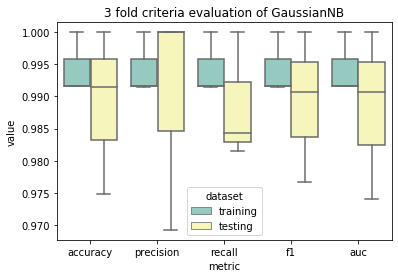

In [9]:
# Gaussian Naive Bayes 
gnb = GaussianNB(); metrics_NB_training,metrics_NB_testing = cvtrain_performance(gnb)
draw_boxplots(metrics_NB_training,metrics_NB_testing,'GaussianNB')

#### Linear Discriminant Analysis

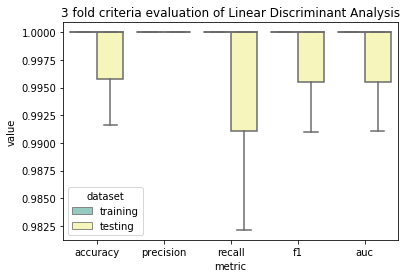

In [10]:
# LDA
lda = LinearDiscriminantAnalysis(n_components=1)
metrics_lda_training,metrics_lda_testing = cvtrain_performance(lda)
draw_boxplots(metrics_lda_training,metrics_lda_testing,'Linear Discriminant Analysis')

#### Quadratic Discriminant Analysis

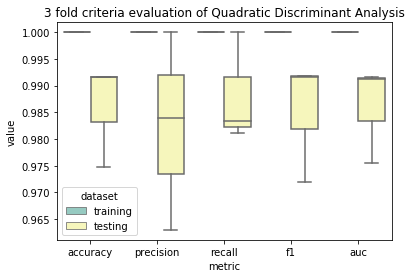

In [11]:
qda = QuadraticDiscriminantAnalysis()
metrics_qda_training,metrics_qda_testing = cvtrain_performance(qda)
draw_boxplots(metrics_qda_training,metrics_qda_testing,'Quadratic Discriminant Analysis')

From the results of LDA and QDA, we can notice that LDA actually has a better performance than QDA do. The main difference between them is that, with LDA, the standard deviation is the same for all the classes, while each class has its own standard deviation with QDA. To better understand our results, we can visualize the decision boundary learned by LDA and QDA:

In [12]:
from scipy import linalg

import matplotlib as mpl
from matplotlib import colors
# #############################################################################
# Colormap
cmap = colors.LinearSegmentedColormap(
    'red_blue_classes',
    {'red': [(0, 1, 1), (1, 0.7, 0.7)],
     'green': [(0, 0.7, 0.7), (1, 0.7, 0.7)],
     'blue': [(0, 0.7, 0.7), (1, 1, 1)]})
plt.cm.register_cmap(cmap=cmap)

# #############################################################################
# Generate datasets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(obs, label, test_size=1/3, random_state=0)

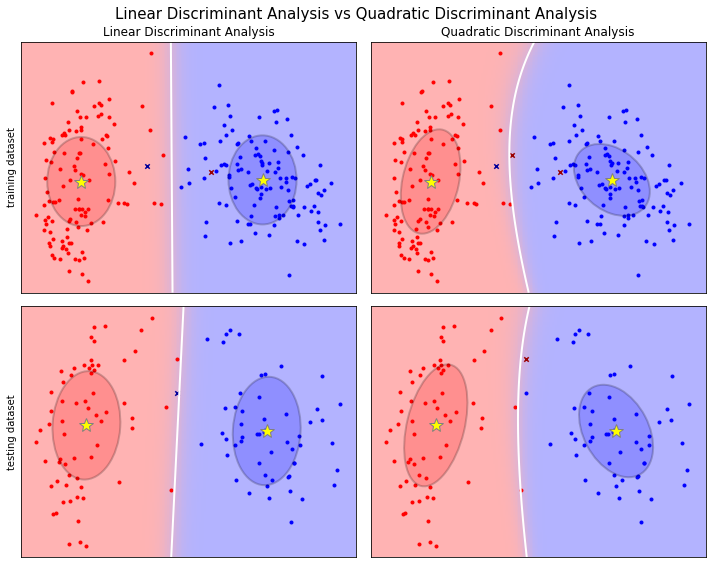

In [13]:
# #############################################################################
#  Plot functions
def plot_data(lda, X, y, y_pred, fig_index):
    splot = plt.subplot(2, 2, fig_index)
    if fig_index == 1:
        plt.title('Linear Discriminant Analysis')
        plt.ylabel('training dataset')
    elif fig_index == 2:
        plt.title('Quadratic Discriminant Analysis')
    elif fig_index == 3:
        plt.ylabel('testing dataset')

    tp = (y == y_pred)  # True Positive
    tp0, tp1 = tp[y == 0], tp[y == 1]
    X0, X1 = X[y == 0], X[y == 1]
    X0_tp, X0_fp = X0[tp0], X0[~tp0]
    X1_tp, X1_fp = X1[tp1], X1[~tp1]

    # class 0: dots
    plt.scatter(X0_tp[:, 0], X0_tp[:, 1], marker='.', color='red')
    plt.scatter(X0_fp[:, 0], X0_fp[:, 1], marker='x',
                s=20, color='#990000')  # dark red

    # class 1: dots
    plt.scatter(X1_tp[:, 0], X1_tp[:, 1], marker='.', color='blue')
    plt.scatter(X1_fp[:, 0], X1_fp[:, 1], marker='x',
                s=20, color='#000099')  # dark blue

    # class 0 and 1 : areas
    nx, ny = 200, 100
    x_min, x_max = plt.xlim()
    y_min, y_max = plt.ylim()
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, nx),
                         np.linspace(y_min, y_max, ny))
    Z = lda.predict_proba(np.c_[xx.ravel(), yy.ravel()])
    Z = Z[:, 1].reshape(xx.shape)
    plt.pcolormesh(xx, yy, Z, cmap='red_blue_classes',
                   norm=colors.Normalize(0., 1.), zorder=0)
    plt.contour(xx, yy, Z, [0.5], linewidths=2., colors='white')

    # means
    plt.plot(lda.means_[0][0], lda.means_[0][1],
             '*', color='yellow', markersize=15, markeredgecolor='grey')
    plt.plot(lda.means_[1][0], lda.means_[1][1],
             '*', color='yellow', markersize=15, markeredgecolor='grey')

    return splot


def plot_ellipse(splot, mean, cov, color):
    v, w = linalg.eigh(cov)
    u = w[0] / linalg.norm(w[0])
    angle = np.arctan(u[1] / u[0])
    angle = 180 * angle / np.pi  # convert to degrees
    # filled Gaussian at 2 standard deviation
    ell = mpl.patches.Ellipse(mean, 2 * v[0] ** 0.5, 2 * v[1] ** 0.5,
                              180 + angle, facecolor=color,
                              edgecolor='black', linewidth=2)
    ell.set_clip_box(splot.bbox)
    ell.set_alpha(0.2)
    splot.add_artist(ell)
    splot.set_xticks(())
    splot.set_yticks(())


def plot_lda_cov(lda, splot):
    plot_ellipse(splot, lda.means_[0], lda.covariance_, 'red')
    plot_ellipse(splot, lda.means_[1], lda.covariance_, 'blue')


def plot_qda_cov(qda, splot):
    plot_ellipse(splot, qda.means_[0], qda.covariance_[0], 'red')
    plot_ellipse(splot, qda.means_[1], qda.covariance_[1], 'blue')


plt.figure(figsize=(10, 8), facecolor='white')
plt.suptitle('Linear Discriminant Analysis vs Quadratic Discriminant Analysis',
             y=0.98, fontsize=15)
for i, (X, y) in enumerate([(pca.transform(X_train),y_train), (pca.transform(X_test),y_test)]):

    # Linear Discriminant Analysis
    lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True)
    y_pred = lda.fit(X, y).predict(X)
    splot = plot_data(lda, X, y, y_pred, fig_index=2 * i + 1)
    plot_lda_cov(lda, splot)
    plt.axis('tight')

    # Quadratic Discriminant Analysis
    qda = QuadraticDiscriminantAnalysis(store_covariance=True)
    y_pred = qda.fit(X, y).predict(X)
    splot = plot_data(qda, X, y, y_pred, fig_index=2 * i + 2)
    plot_qda_cov(qda, splot)
    plt.axis('tight')
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()

In the plots above, the ellipses represent the covariance and the stars represent the center. The lines refers to the decision boundary that the two classifiers have made. We can see clearly that in our case, LDA fits better. However, the curve for QDA causes some kind of inaccuracy.

Some notable points for LDA vs. QDA:
- When the decision boundary is non-linear, QDA usually performs better
- LDA usually performs better when there are fewer training observations (that is, when the variance needs to be reduced)
- QDA usually performs better when the training set is large (ie the difference is small)


#### Logistic Regression

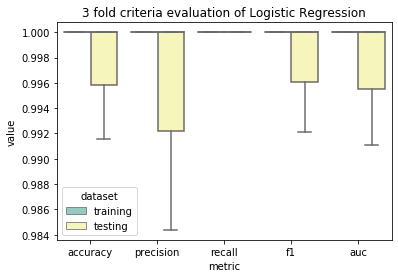

In [14]:
logreg = linear_model.LogisticRegression(
    C=1e3, solver='liblinear'
)
metrics_logreg_training,metrics_logreg_testing = cvtrain_performance(logreg)
draw_boxplots(metrics_logreg_training,metrics_logreg_testing,'Logistic Regression')

#### K Nearest Neighbors 

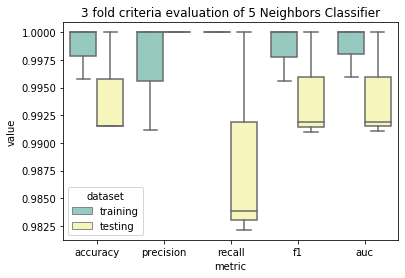

In [15]:
knn0 = KNeighborsClassifier()    # n_neighbors=5 as default
metrics_knn0_training,metrics_knn0_testing = cvtrain_performance(knn0)
draw_boxplots(metrics_knn0_training,metrics_knn0_testing,'{} Neighbors Classifier'.format(knn0.n_neighbors))

For knn, we have k which is a hyperparameter, here we want to try more possible values to reach a highest classification accuracy.

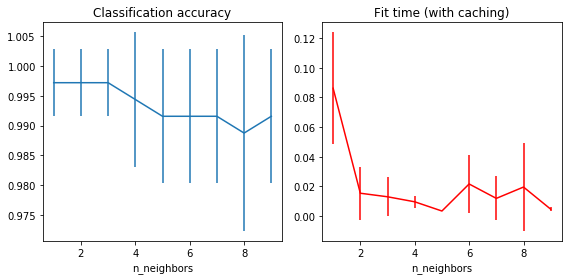

In [16]:
from tempfile import TemporaryDirectory
from sklearn.neighbors import KNeighborsTransformer
from sklearn.model_selection import GridSearchCV
from sklearn.datasets import load_digits
from sklearn.pipeline import Pipeline


n_neighbors_list = [1, 2, 3, 4, 5, 6, 7, 8, 9]
# The transformer computes the nearest neighbors graph using the maximum number
# of neighbors necessary in the grid search. The classifier model filters the
# nearest neighbors graph as required by its own n_neighbors parameter.
graph_model = KNeighborsTransformer(n_neighbors=max(n_neighbors_list),
                                    mode='distance')
classifier_model = KNeighborsClassifier(metric='precomputed')

# Note that we give `memory` a directory to cache the graph computation
# that will be used several times when tuning the hyperparameters of the
# classifier.
with TemporaryDirectory(prefix="sklearn_graph_cache_") as tmpdir:
    full_model = Pipeline(
        steps=[('graph', graph_model), ('classifier', classifier_model)],
        memory=tmpdir)

    param_grid = {'classifier__n_neighbors': n_neighbors_list}
    grid_model = GridSearchCV(full_model, param_grid)
    grid_model.fit(obs, label)

# Plot the results of the grid search.
fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].errorbar(x=n_neighbors_list,
                 y=grid_model.cv_results_['mean_test_score'],
                 yerr=grid_model.cv_results_['std_test_score'])
axes[0].set(xlabel='n_neighbors', title='Classification accuracy')
axes[1].errorbar(x=n_neighbors_list, y=grid_model.cv_results_['mean_fit_time'],
                 yerr=grid_model.cv_results_['std_fit_time'], color='r')
axes[1].set(xlabel='n_neighbors', title='Fit time (with caching)')
fig.tight_layout()
plt.show()

According to the results above, we can see that when $k=3$ we have the highest value of classification accuracy and a relatively very low fitting time. So we choose finally n_neighbors=3 for our knn classifier.

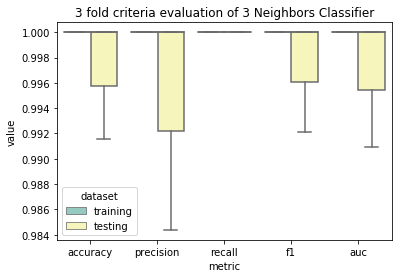

In [17]:
knn = KNeighborsClassifier(n_neighbors=3)
metrics_knn_training,metrics_knn_testing = cvtrain_performance(knn)
draw_boxplots(metrics_knn_training,metrics_knn_testing,'{} Neighbors Classifier'.format(knn.n_neighbors))

#### Decision Tree

In our dataset, we have 64 features ($8 \times 8 $ pixel matrix) for each data, but we have relatively fewer samples (less than 400). So it is necessary for us to tune some meta-parameters in order to avoid over-fitting. Here we want to tune the parameter $\textbf{max_leaf_nodes}$, and actually we can achieve this using cross-validation with the help of `GridSearchCV()` function.

best param: {'max_leaf_nodes': 25}
best score: 0.991549295774648


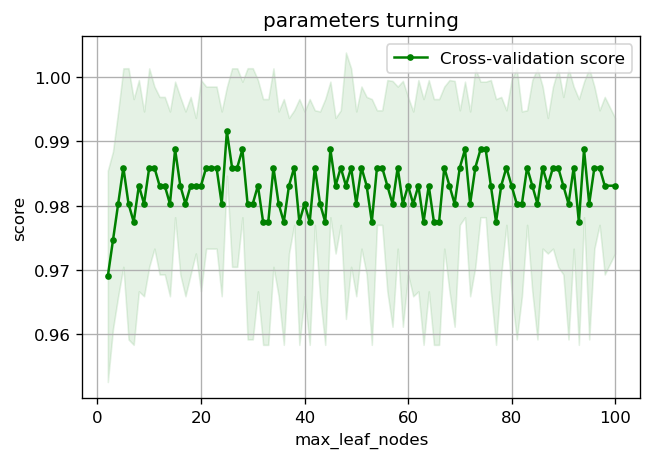

In [18]:
thresholds = np.linspace(0, 100, 100, dtype=int)
# Set the parameters by cross-validation
param_grid = {'max_leaf_nodes': thresholds}

clf = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5)
clf.fit(obs, label)
print("best param: {0}\nbest score: {1}".format(clf.best_params_, 
                                                clf.best_score_))

def plot_curve(train_sizes, cv_results, xlabel):
    test_scores_mean = cv_results['mean_test_score']
    test_scores_std = cv_results['std_test_score']
    plt.figure(figsize=(6, 4), dpi=120)
    plt.title('parameters turning')
    plt.grid()
    plt.xlabel(xlabel)
    plt.ylabel('score')
    plt.fill_between(train_sizes, 
                     test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, 
                     alpha=0.1, color="g")
    plt.plot(train_sizes, test_scores_mean, '.-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    
plot_curve(thresholds, clf.cv_results_, xlabel='max_leaf_nodes')

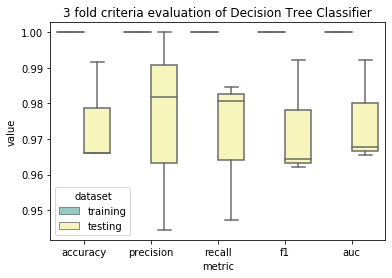

In [19]:
dtree = tree.DecisionTreeClassifier(
    random_state=0, splitter = 'best', max_leaf_nodes = list(clf.best_params_.values())[0]
)
metrics_tree_training,metrics_tree_testing = cvtrain_performance(dtree)
draw_boxplots(metrics_tree_training,metrics_tree_testing,'Decision Tree Classifier')

Until now, we have implemented all the possible simple classifiers. We want to choose the best one with the highest AUC score and then compete with the other ensemble methods, which we will train later.

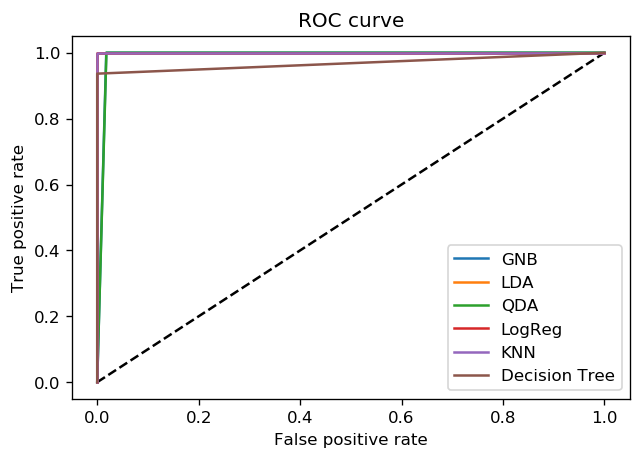

In [20]:
# split the dataset into training and testing dataset
X_train, X_test, y_train, y_test = train_test_split(obs, label, test_size=1/3, random_state=333)

# fit every model and compute its fpr and tpr for the prediction on testing dataset
gnbfit=gnb.fit(X_train,y_train);gnb_y_proba = gnbfit.predict_proba(X_test)[:,1]
fpr_gnb, tpr_gnb, _ = metrics.roc_curve(y_test, gnb_y_proba)

ldafit=lda.fit(X_train,y_train);lda_y_proba = ldafit.predict_proba(X_test)[:,1]
fpr_lda, tpr_lda, _ = metrics.roc_curve(y_test, lda_y_proba)

qdafit=qda.fit(X_train,y_train);qda_y_proba = qdafit.predict_proba(X_test)[:,1]
fpr_qda, tpr_qda, _ = metrics.roc_curve(y_test, qda_y_proba)

logregfit=logreg.fit(X_train,y_train);logreg_y_proba = logregfit.predict_proba(X_test)[:,1]
fpr_logreg, tpr_logreg, _ = metrics.roc_curve(y_test, logreg_y_proba)

knnfit=knn.fit(X_train,y_train);knn_y_proba = knnfit.predict_proba(X_test)[:,1]
fpr_knn, tpr_knn, _ = metrics.roc_curve(y_test, knn_y_proba)

treefit=dtree.fit(X_train,y_train);tree_y_proba = treefit.predict_proba(X_test)[:,1]
fpr_tree, tpr_tree, _ = metrics.roc_curve(y_test, tree_y_proba)

# plot the roc curves of all classifiers
plt.figure(figsize=(6, 4), dpi=120)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_gnb, tpr_gnb, label='GNB')
plt.plot(fpr_lda, tpr_lda, label='LDA')
plt.plot(fpr_qda, tpr_qda, label='QDA')
plt.plot(fpr_logreg, tpr_logreg, label='LogReg')
plt.plot(fpr_knn, tpr_knn, label='KNN')
plt.plot(fpr_tree, tpr_tree, label='Decision Tree')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()

The ROC curves plots show us that the best simple classifier is the KNN with k = 3.

### Ensemble classifiers (bagging, RandomForest, Adaboost, Gradient Boosting, Stacking)

In [21]:
# packages required for ensemble methods
from sklearn.tree import export_text
from sklearn.datasets import make_classification
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier

#### Bagging

In [22]:
# Bagging
treemod = tree.DecisionTreeClassifier() 
bagmod=BaggingClassifier(base_estimator=treemod, n_estimators=10, random_state=0)
treemodfit=treemod.fit(obs, label); bagmodfit=bagmod.fit(X_train, y_train)

pY_test=bagmodfit.predict_proba(X_test)
predxclass=np.argmax(pY_test,axis=1)

# Accuracy
acc_bagging = metrics.accuracy_score(y_test,predxclass)
# roc indicaters
fpr_bagging, tpr_bagging, _ = metrics.roc_curve(y_test, pY_test[:,1])

#### Random Forest

In [23]:
# Random Forest
RF = RandomForestClassifier(max_depth=2, random_state=0, oob_score = True)
RFfit = RF.fit(X_train, y_train)

pY_test=RFfit.predict_proba(X_test)
predxclass=np.argmax(pY_test,axis=1)

# Accuracy
acc_RF = metrics.accuracy_score(y_test,predxclass)
# roc indicaters
fpr_RF, tpr_RF, _ = metrics.roc_curve(y_test, pY_test[:,1])

print("the classification accuracy of RF is:",acc_RF)
print("the OOB score of RF is:",RF.oob_score_)

the classification accuracy of RF is: 0.9915966386554622
the OOB score of RF is: 0.9830508474576272


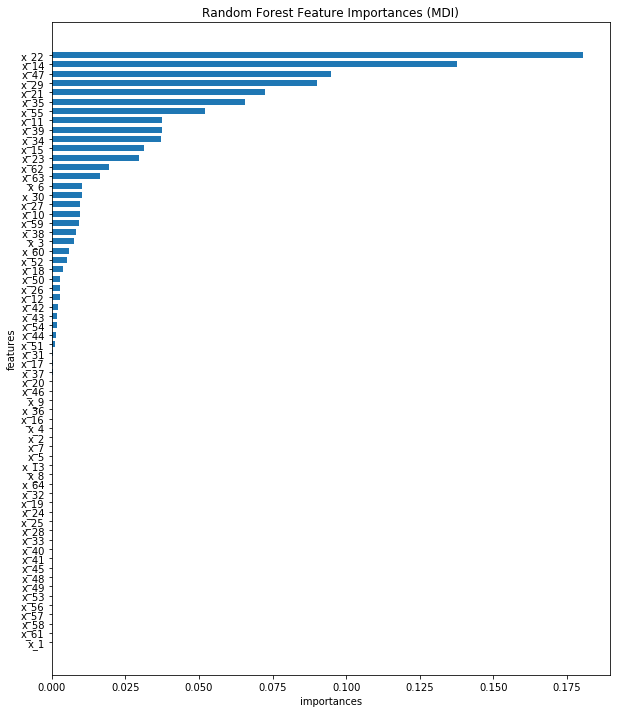

In [24]:
# feature importance
feature_names = ["x_{}".format(i+1) for i in range(len(obs[1]))]
feature_importances = RF.feature_importances_

feature_importances = [round(x,4) for x in feature_importances]
F2 = pd.Series(feature_importances,index = feature_names)
F2 = F2.sort_values(ascending = True)
f_index = F2.index; f_values = F2.values

x_index = list(range(0,64))
x_index = [x/64 for x in x_index]
plt.rcParams['figure.figsize'] = (10,12)
plt.barh(x_index,f_values,height = 0.01 ,align="center",tick_label=f_index)
plt.xlabel('importances'); plt.ylabel('features')
plt.title("Random Forest Feature Importances (MDI)")
plt.show()


#### AdaBoost

In [25]:
# AdaBoost
Ab = AdaBoostClassifier(n_estimators=100, random_state=0)
Abfit=Ab.fit(X_train, y_train)

pY_test=Abfit.predict_proba(X_test)
predxclass=np.argmax(pY_test,axis=1)

# Accuracy
acc_Ab = metrics.accuracy_score(y_test,predxclass)
# roc indicaters
fpr_Ab, tpr_Ab, _ = metrics.roc_curve(y_test, pY_test[:,1])

#### Gradient Boost

In [26]:
# GradientBoost
GB = GradientBoostingClassifier(random_state=0,n_estimators=20)
GBfit=GB.fit(X_train, y_train)

pY_test=GBfit.predict_proba(X_test)
predxclass=np.argmax(pY_test,axis=1)

# Accuracy
acc_Gb = metrics.accuracy_score(y_test,predxclass)
# roc indicaters
fpr_Gb, tpr_Gb, _ = metrics.roc_curve(y_test, pY_test[:,1])

Text(0.5, 0, 'Number of Trees')

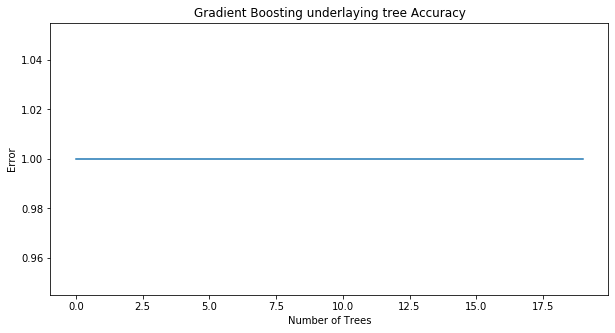

In [27]:
GB_staged=GB.staged_predict(X_train)
GB_seq_errors = []

# no need to demonstrate this plot cause it converges too fast on our tiny dataset....
for GB_train_predict in GB.staged_predict(X_train):
    GB_seq_errors.append(metrics.accuracy_score(GB_train_predict, y_train))
plt.figure(figsize=(10, 5))
plt.plot(GB_seq_errors); plt.title('Gradient Boosting underlaying tree Accuracy') 
plt.ylabel('Error'); plt.xlabel('Number of Trees')

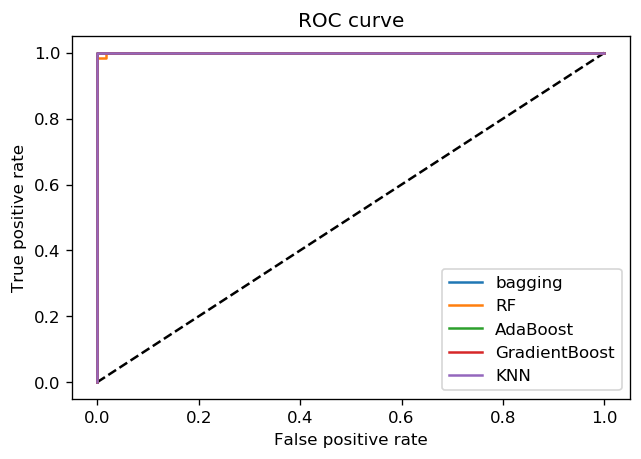

In [28]:
# plot the roc curves of all classifiers
plt.figure(figsize=(6, 4), dpi=120)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_bagging, tpr_bagging, label='bagging')
plt.plot(fpr_RF, tpr_RF, label='RF')
plt.plot(fpr_Ab, tpr_Ab, label='AdaBoost')
plt.plot(fpr_Gb, tpr_Gb, label='GradientBoost')
plt.plot(fpr_knn, tpr_knn, label='KNN')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()

Since all of these ensemble models have pretty nice forms of roc curves, it is relatively hard to figure out which one is better than the others. So we would like to print their classification accuracy for comparison.

In [29]:
{'bagging':acc_bagging, 'Random Forest':acc_RF, 'AdaBoost': acc_Ab, 'Gradient Boost':acc_Gb, 'KNN': metrics.accuracy_score(y_test, knnfit.predict(X_test))}

{'bagging': 0.9747899159663865,
 'Random Forest': 0.9915966386554622,
 'AdaBoost': 1.0,
 'Gradient Boost': 0.9663865546218487,
 'KNN': 0.9915966386554622}

We can see that among all the ensemble models, AdaBoost has the best performance on testing dataset, then comes the Random Forest and our best simple classifer KNN.